In [2]:
import matplotlib.pyplot as plt
import numpy as np

from src.structured_random_features.src.models.weights import V1_weights

# Packages for fft and fitting data
# from scipy import fftpack as fft
# from sklearn.linear_model import Lasso

# Package for importing image representation
from PIL import Image, ImageOps

# My code
from src.V1_Compress import generate_Y, compress
from src.filter_reconst import filter_reconstruction

import seaborn as sns
import time
import os.path

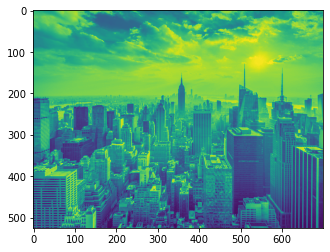

In [3]:
image_nm = 'city.png'
img = Image.open('image/' + image_nm)
img = ImageOps.grayscale(img)
img_arr = np.asarray(img)
plt.imshow(img)
orig_dim = img_arr.shape

(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430


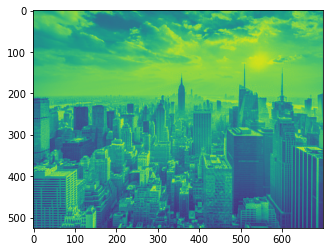

In [4]:
plt.imshow(filter_reconstruction(200, img_arr, 7, 2))

In [5]:
low_cell_res = filter_reconstruction(50, img_arr, 7, 2)
mid_cell_res = filter_reconstruction(200, img_arr, 7, 2)
high_cell_res = filter_reconstruction(500, img_arr, 7, 2)

(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344


C:\Users\qkstn\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 123060.79931416461, tolerance: 110770.28292036691
  model = cd_fast.enet_coordinate_descent(
C:\Users\qkstn\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 146531.5212311309, tolerance: 131238.9983167064
  model = cd_fast.enet_coordinate_descent(
C:\Users\qkstn\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 120507.56325165468, tolerance: 86476.65405954349
  model = cd_fast.enet_coordinate_descent(
C:\Users\qkstn\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWar

iteration 430


C:\Users\qkstn\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 92981.34379816726, tolerance: 70114.45957697609
  model = cd_fast.enet_coordinate_descent(
C:\Users\qkstn\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153958.73264507772, tolerance: 133623.0226837345
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430


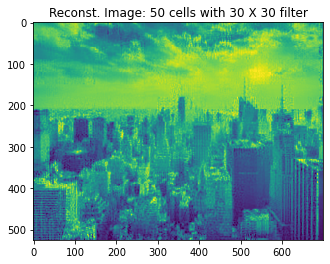

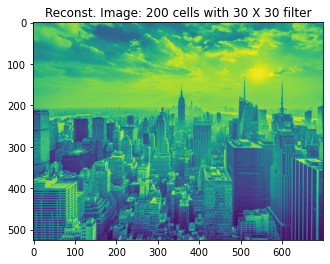

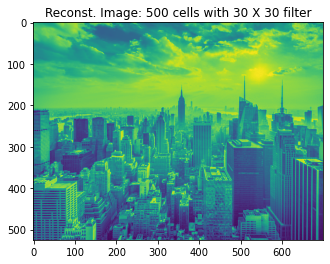

In [4]:
plt.imshow(low_cell_res, vmin = 0, vmax = 256)
plt.title('Reconst. Image: 50 cells with 30 X 30 filter')
plt.show()

plt.imshow(mid_cell_res, vmin = 0, vmax = 256)
plt.title('Reconst. Image: 200 cells with 30 X 30 filter')
plt.show()

plt.imshow(high_cell_res, vmin = 0, vmax = 256)
plt.title('Reconst. Image: 500 cells with 30 X 30 filter')
plt.show()

In [1]:
n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(np.abs(img_arr - mid_cell_res), vmin=0, vmax=256)
plt.title('Error Iamge: 200 cells with 30 X 30 filter')
plt.colorbar(ax)
np.linalg.norm(img - high_cell_res, 'fro') / np.sqrt(m*n)

NameError: name 'img_arr' is not defined

14.551881895740104

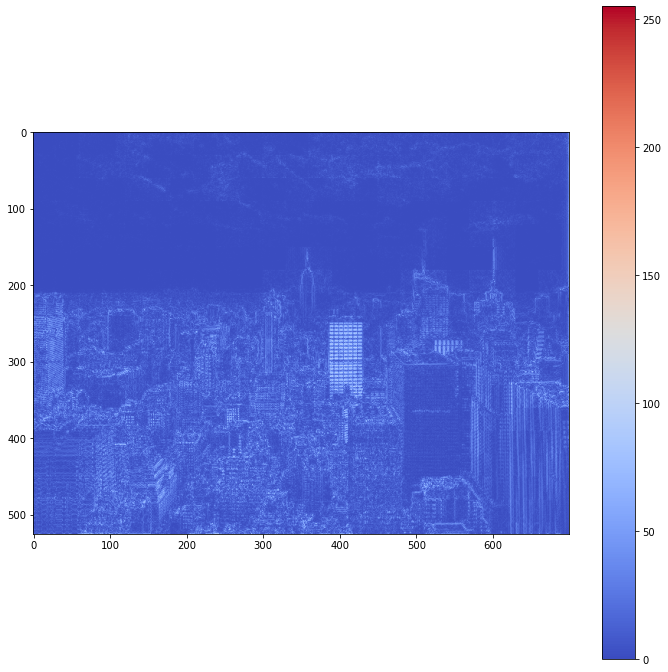

In [7]:
n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(np.abs(img_arr - mid_cell_res), vmin=-255, vmax=255, cmap = 'coolwarm')
plt.colorbar(ax,)
np.linalg.norm(img - mid_cell_res, 'fro') / np.sqrt(m*n)

10.199342853334564

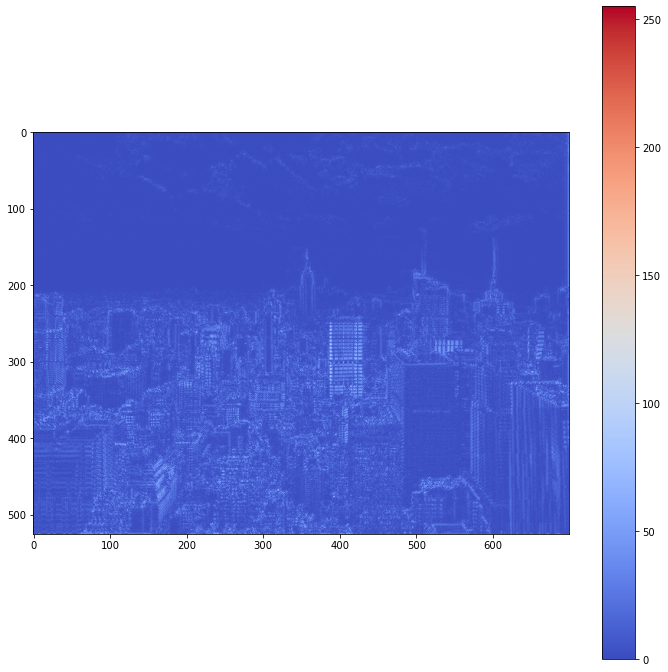

In [8]:
n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(np.abs(img_arr - high_cell_res), vmin=0, vmax=255, cmap = 'coolwarm')
plt.colorbar(ax)
np.linalg.norm(img - high_cell_res, 'fro') / np.sqrt(m*n)

(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430


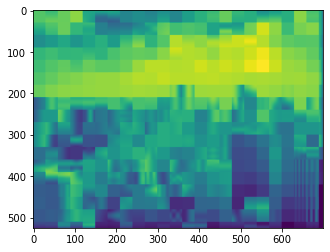

In [13]:
temp = filter_reconstruction(num_cell =200, img_arr = img_arr, sparse_freq = 2, cell_size = 7, alpha = 5000)

plt.imshow(temp)

(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 861.9550581135585, tolerance: 578.7719271416838
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 92974.4235724601, tolerance: 53438.386332635324
  model = cd_fast.enet_coordinate_descent(


iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1525.4735077325267, tolerance: 1272.8166566893178
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 391925.0805513916, tolerance: 246563.41880603833
  model = cd_fast.enet_coordinate_descent(


iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 127663.48556740646, tolerance: 82705.24194215458
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 488492.6239576949, tolerance: 366619.8728744502
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 198590.97290016312, tolerance: 184726.8060374165
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent

iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 111253.24210139214, tolerance: 91710.34073068932
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 425921.6375228176, tolerance: 367204.6102587495
  model = cd_fast.enet_coordinate_descent(


iteration 86
iteration 172
iteration 258
iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 61594.27308474967, tolerance: 28479.44650991992
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101797.70418653566, tolerance: 91038.01377097298
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 226454.94836242788, tolerance: 111546.9394522004
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent

iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81459.2317083251, tolerance: 55307.55807669634
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 203228.67924265945, tolerance: 141607.69402902518
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 297287.03654395125, tolerance: 274881.78735758335
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 107732.4772747503, tolerance: 105571.95740366101
  model = cd_fast.enet_coordinate_descent(


iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
it

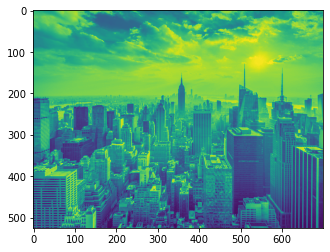

In [4]:
#import image information
image_nm = 'city.png'
img = Image.open('image/' + image_nm)
img = ImageOps.grayscale(img)
img_arr = np.asarray(img)
plt.imshow(img)
dim = img_arr.shape

# res1 for fixed alpha value and res2 for storing alpha value depending on number of cell
res1 = []
res2 = []
param_list = []
num_cell = 100
sparse_freq = 2
cell_size = 7
num_cell_list = [50, 100, 300, 500]

for num_cell in num_cell_list:
    for alpha in [0.0002, 0.002, 0.02, 0.2, 2, 20] :
        param_list.append((num_cell, alpha))
        res1.append(filter_reconstruction(num_cell = num_cell, img_arr = img_arr, 
                                          sparse_freq = sparse_freq, cell_size = cell_size, alpha = alpha))
    res2.append(filter_reconstruction(num_cell = num_cell, img_arr = img_arr, 
                                      sparse_freq = sparse_freq, cell_size = cell_size))

In [5]:
# path to save image array into image
save_path = os.path.join('./result/auto_alpha_comparison/')

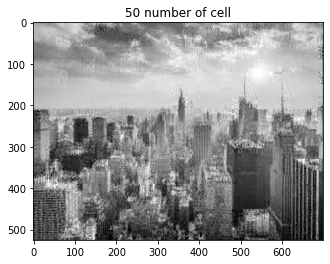

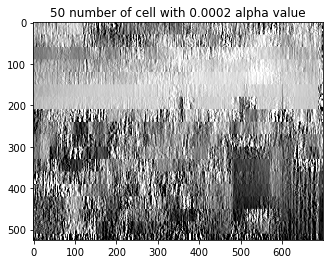

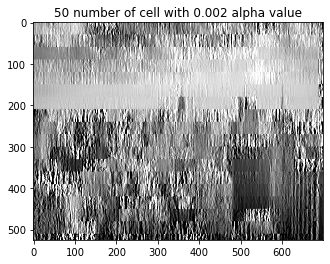

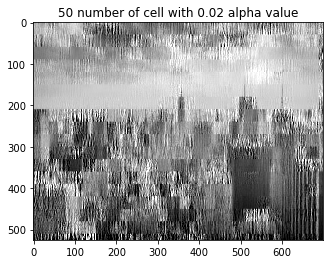

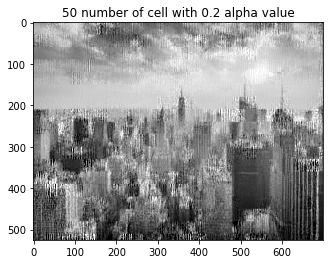

...

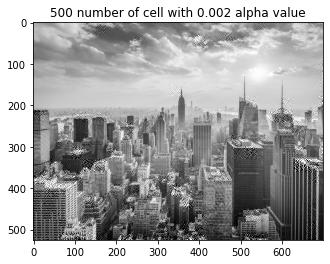

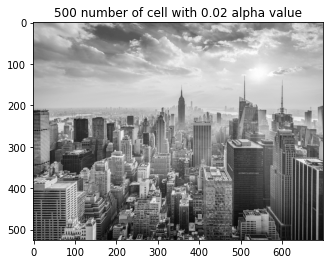

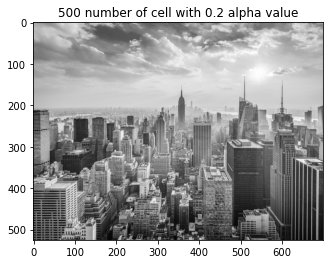

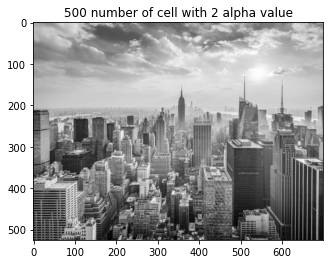

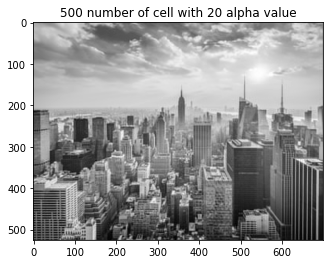

In [8]:
cell = 0

for i, r2 in enumerate(res1):
    if (param_list[i][0] != cell):
        r1 = res2[i % len(res2)]
        cell = param_list[i][0]
        title1 = "{num_cell} number of cell".format(num_cell = cell)
        np.save(save_path + (title1.replace(" ", "_")) + ".npy", r1)
        plt.imshow(r1, cmap = 'gray', vmin=0, vmax=255)
        plt.title(title1)
        plt.savefig(save_path + (title1.replace(" ", "_")) + "_scaled.png", dpi=200)
        plt.show()
        
#         im1 = Image.fromarray(r1)
#         im1.save(save_path + (title1.replace(" ", "_")) + "_color_scaled.png")
        
    title2 = "{num_cell} number of cell with {alpha} alpha value".format(
        num_cell = param_list[i][0], alpha = param_list[i][1])
    np.save(save_path + (title2.replace(" ", "_")) + ".npy", r2)
    plt.imshow(r2, cmap = 'gray', vmin=0, vmax=255)
    plt.title(title2) 
    plt.savefig(save_path + (title2.replace(" ", "_")) + "_scaled.png", dpi=200)
    plt.show()
    
#     im2 = Image.fromarray(r2)
#     im2.save(save_path + title2.replace(" ", "_") + "_color_scaled.png" )


In [44]:
save_path = os.path.join('./result/auto_alpha_comparison/')


'./result/auto_alpha_comparison/50_number_of_cell.png'

In [24]:
Image.save()

TypeError: list indices must be integers or slices, not tuple

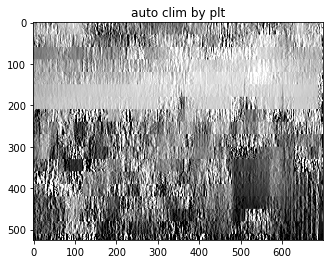

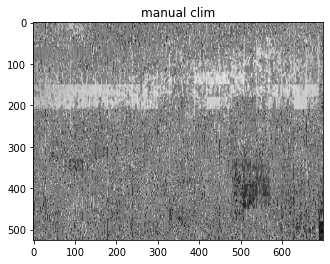

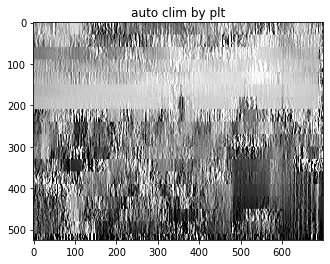

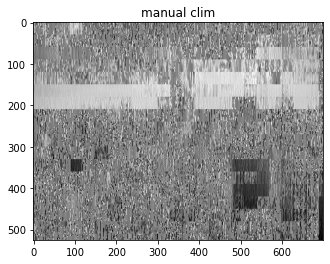

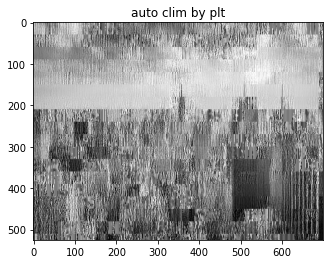

...

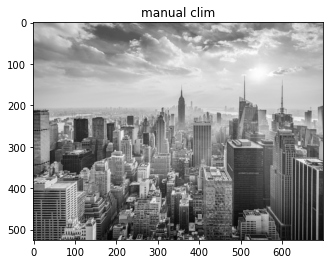

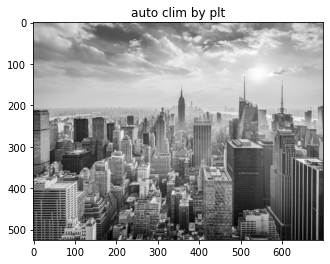

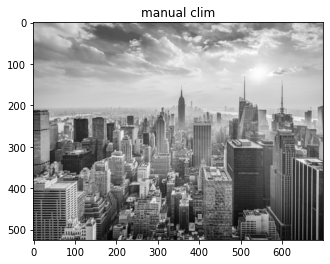

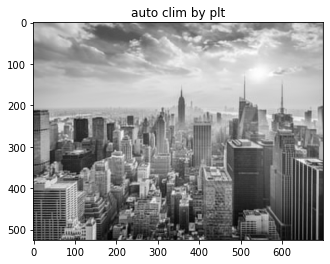

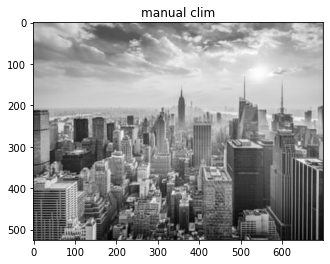

In [76]:
for i in range(len(res1)):
    plt.imshow(res1[i], vmin = 0, vmax = 255, cmap = 'gray')
    plt.title("auto clim by plt")
    plt.show()

    t = res1[i]
    t[t > 255] = 255
    t[t < 0] = 0

    plt.imshow(t, cmap = "gray")
    plt.title("manual clim")
    plt.show()

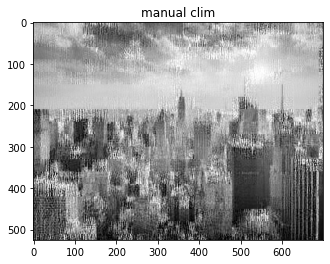

In [88]:
t = res1[3]
t[t > 255] = 255
t[t < 0] = 0

plt.imshow(t, cmap = "gray")
plt.title("manual clim")
plt.show()

In [87]:
n = [[1, 2, 3], [4, 5, 6], [7, 8, 9, 10]]
np.asarray(n)

array([list([1, 2, 3]), list([4, 5, 6]), list([7, 8, 9, 10])],
      dtype=object)